In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import time
import gget
from scipy.stats import spearmanr
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from tqdm import tqdm
import textwrap
from scipy.stats import linregress

import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.patches import Patch

import cupy as cp
import cudf
import cuml
from cuml.linear_model import Lasso

import anndata as an
import scanpy as sc
import rapids_singlecell as rsc
import scvi

from scvi.external import CellAssign

import rmm
from rmm.allocators.cupy import rmm_cupy_allocator
# Enable `managed_memory`
rmm.reinitialize(
    managed_memory=True,
    pool_allocator=False,
)

cp.cuda.set_allocator(rmm_cupy_allocator)


sc.settings.verbosity = 3

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


# Load Genes

In [2]:
%%time
fpath = "../../../resources/gene_names.tsv.gz"
gdf = pd.read_csv(fpath, sep='\t', low_memory=False)
print(f"{gdf.shape=}")

protein_coding = gdf[gdf['Gene type'] == 'protein_coding']['Gene name'].unique()
print(f"N protein coding: {protein_coding.shape=}")

gdf.shape=(73466, 8)
N protein coding: protein_coding.shape=(18149,)
CPU times: user 181 ms, sys: 22.9 ms, total: 204 ms
Wall time: 204 ms


# Load anndata

In [3]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/pseudotime.h5ad"
adata = sc.read_h5ad(fpath)

cluster_map = {
    'C2' : 'C2',
    'C3' : 'C3',
    'C4' : 'Control',
    'C5' : 'Control',
}

adata.obs['cell_type'] = adata.obs['cluster_str'].map(cluster_map)

adata

CPU times: user 705 ms, sys: 3.03 s, total: 3.74 s
Wall time: 5.74 s


AnnData object with n_obs × n_vars = 15867 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'cell_type'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions

# Gene Filtering

In [4]:
adata.var['filter_pass'] = True # set the gene filter

# protein-coding genes
adata.var['filter_pass'] = np.where(~adata.var.index.isin(protein_coding), False, adata.var['filter_pass'])

# disallow GO cell cycle genes
fpath = "../../../resources/human_cell_cycle_genes.csv"
cdf = pd.read_csv(fpath)
adata.var['filter_pass'] = np.where(adata.var.index.isin(cdf['gene_name'].unique()), False, adata.var['filter_pass'])

# disallow Regev cell cycle genes
fpath = "../../../resources/regev_lab_cell_cycle_genes.txt"
genes = [x.strip() for x in open(fpath)]
adata.var['filter_pass'] = np.where(adata.var.index.isin(genes), False, adata.var['filter_pass'])

# disallow mitochondrial and ribosomal genes
adata.var['filter_pass'] = np.where(adata.var.index.str.startswith('MT'), False, adata.var['filter_pass'])
adata.var['filter_pass'] = np.where(adata.var.index.str.startswith('RP'), False, adata.var['filter_pass'])

print(adata.var['filter_pass'].value_counts().to_string())

filter_pass
True     13052
False     8360


# Load Capybara scores

In [5]:
file_list = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/"
glob.glob(f"{file_list}*scale*")

['/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/celltype_scale.csv',
 '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/basename_simple_scale.csv',
 '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/capybara_scale.csv',
 '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/hand_select_scale.csv',
 '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/gomes_scale.csv',
 '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/celltype_simplified_scale.csv',
 '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/riba_scale.csv',
 '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/population_mean_scale.csv',
 '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/c

In [6]:
%%time
# Load Capybara output
# fpath_scale = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/hand_select_scale.csv"
# fpath_scale = '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/celltype_simplified_scale.csv'
fpath_scale = '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/population_mean_scale.csv'
# fpath_scale = '/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/basename_simple_scale.csv'
df = pd.read_csv(fpath_scale)
print(f"{df.shape=}")
df.head()

df.shape=(15867, 11)
CPU times: user 32.8 ms, sys: 5.86 ms, total: 38.7 ms
Wall time: 39.8 ms


,cell_name,frxn_embryonic fibroblast,frxn_endothelial - other,frxn_endothelial cell,frxn_fibro/adipogenic progenitor cell,frxn_fibroblast - other,frxn_hematopoietic - other,frxn_hematopoietic stem cell,frxn_skin fibroblast,Lagrangian,Error
0,AAACCCAAGGTTACCT-1,0.240466,0.068801,5.094955e-02,0.206029,-1.050233e-17,-6.938894e-18,0.215566,0.117665,0,2315.433049
1,AAACCCAAGTTGAAGT-1,0.197866,0.070568,5.984661e-02,0.298920,-7.169738e-18,0.000000e+00,0.209199,0.055345,0,2389.094632
2,AAACCCAAGTTGTCGT-1,0.318207,0.062081,0.000000e+00,0.127480,-1.050881e-17,4.396894e-02,0.166699,0.109903,0,2362.126619
3,AAACCCACAGAAGCGT-1,0.267038,0.062885,1.435880e-18,0.189187,-3.954457e-18,0.000000e+00,0.134341,0.204559,0,2402.421313
4,AAACCCACAGGAGGTT-1,0.249263,0.115425,1.184124e-01,0.122312,0.000000e+00,1.082309e-18,0.146050,0.109435,0,2139.344221


In [7]:
# Set index to 'cell_name' for merging
df = df.set_index('cell_name')

# Sanity check: ensure all indices in df exist in adata.obs
common_cells = adata.obs.index.intersection(df.index)
print(f"Merging on {len(common_cells)} shared cells")

# Merge into adata.obs
adata.obs = adata.obs.join(df, how='left')  # 'left' keeps all cells in adata.obs

adata.obs.head()

Merging on 15867 shared cells


,batch,phase,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,...,frxn_embryonic fibroblast,frxn_endothelial - other,frxn_endothelial cell,frxn_fibro/adipogenic progenitor cell,frxn_fibroblast - other,frxn_hematopoietic - other,frxn_hematopoietic stem cell,frxn_skin fibroblast,Lagrangian,Error
AAACCCAAGGTTACCT-1,hsc,G1,3679,8.210668,11202.0,9.323937,27.932512,37.752187,47.491519,60.382075,...,0.240466,0.068801,5.094955e-02,0.206029,-1.050233e-17,-6.938894e-18,0.215566,0.117665,0,2315.433049
AAACCCAAGTTGAAGT-1,hsc,G1,3987,8.291045,10579.0,9.266721,24.766046,32.867001,40.835618,53.313168,...,0.197866,0.070568,5.984661e-02,0.298920,-7.169738e-18,0.000000e+00,0.209199,0.055345,0,2389.094632
AAACCCAAGTTGTCGT-1,hsc,S,2585,7.857868,6735.0,8.815222,28.537491,37.371938,48.136600,63.533779,...,0.318207,0.062081,0.000000e+00,0.127480,-1.050881e-17,4.396894e-02,0.166699,0.109903,0,2362.126619
AAACCCACAGAAGCGT-1,hsc,G1,2358,7.765993,5416.0,8.597297,24.686115,34.785820,45.217873,60.672083,...,0.267038,0.062885,1.435880e-18,0.189187,-3.954457e-18,0.000000e+00,0.134341,0.204559,0,2402.421313
AAACCCACAGGAGGTT-1,hsc,G1,4997,8.516793,21937.0,9.995976,31.845740,40.552491,50.152710,63.440762,...,0.249263,0.115425,1.184124e-01,0.122312,0.000000e+00,1.082309e-18,0.146050,0.109435,0,2139.344221


# Predictions by Cluster

frxn_embryonic fibroblast
frxn_endothelial - other
frxn_endothelial cell
frxn_fibro/adipogenic progenitor cell
frxn_fibroblast - other
frxn_hematopoietic - other
frxn_hematopoietic stem cell
frxn_skin fibroblast


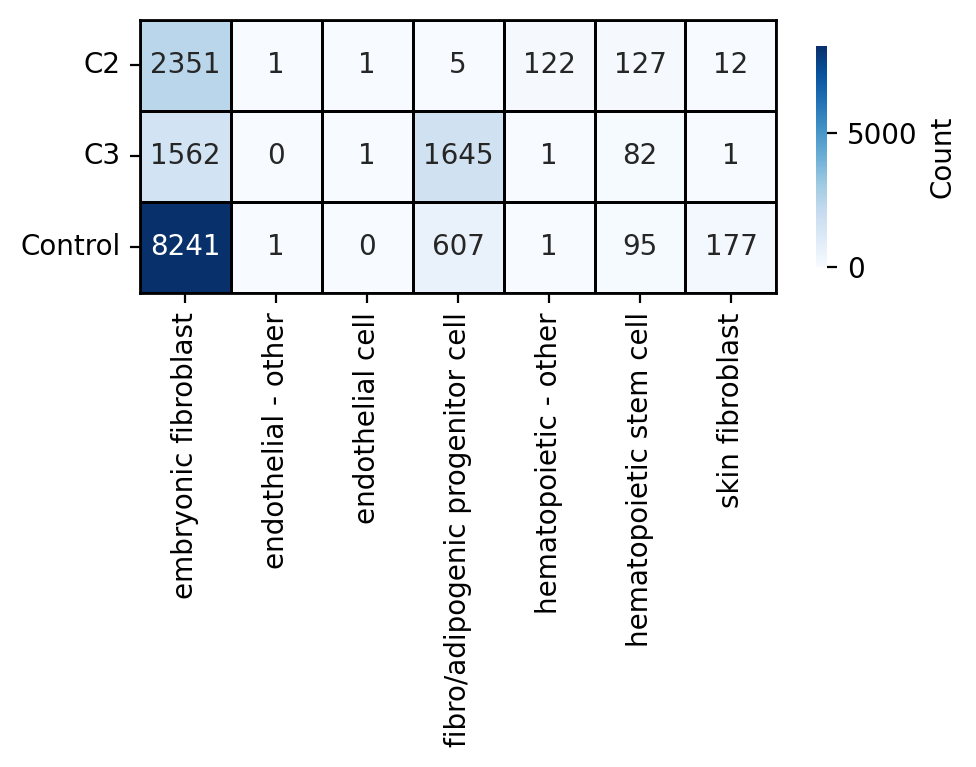

In [8]:
df = adata.obs.copy()
frxn_cols = [col for col in df.columns if col.startswith("frxn_")]

for x in frxn_cols:
    print(x)

df['prediction'] = df[frxn_cols].idxmax(axis=1)
df['prediction'] = df['prediction'].apply(lambda x: x.replace("frxn_", ""))

X = pd.crosstab(df['cell_type'], df['prediction'])

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 5

ax = sns.heatmap(
    X,
    annot=True,
    fmt="d",
    linewidths=0.5,
    linecolor='k',
    square=True,
    cmap='Blues',
    cbar_kws={"label": "Count", 'shrink' : 0.3},
)

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', rotation=0)
plt.tight_layout()


# Add all spines (borders)
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)
    spine.set_edgecolor("black")
    
plt.show()


frxn_embryonic fibroblast
frxn_endothelial - other
frxn_endothelial cell
frxn_fibro/adipogenic progenitor cell
frxn_fibroblast - other
frxn_hematopoietic - other
frxn_hematopoietic stem cell
frxn_skin fibroblast


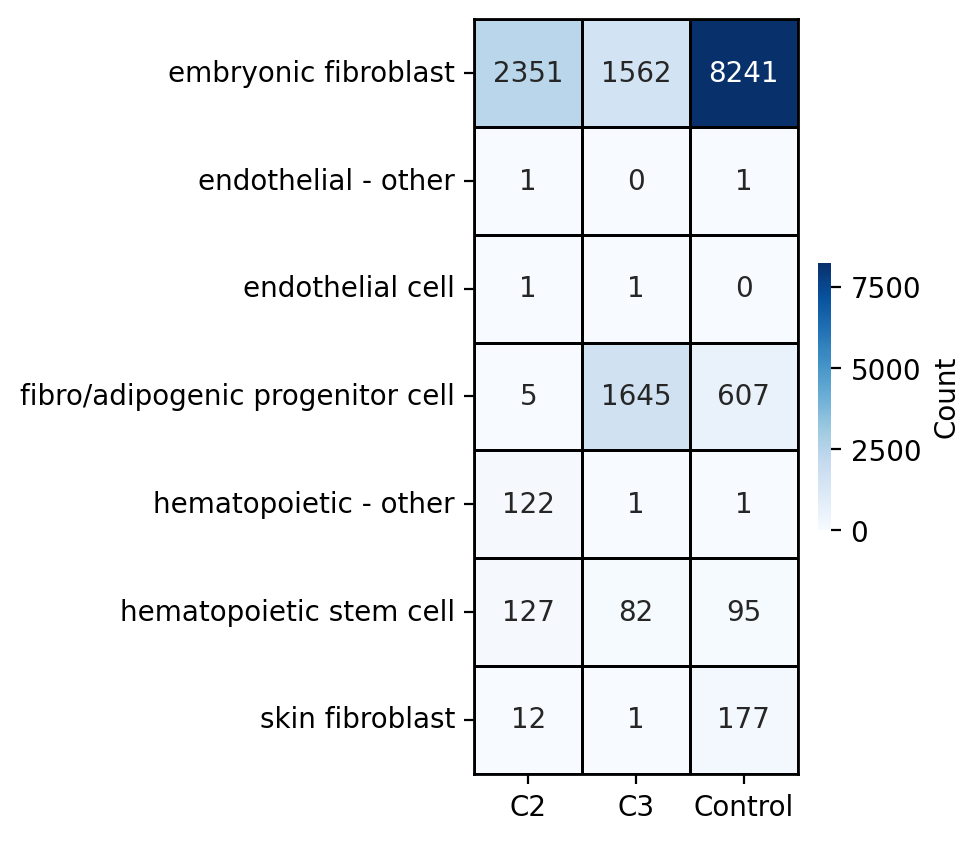

In [9]:
df = adata.obs.copy()
frxn_cols = [col for col in df.columns if col.startswith("frxn_")]

for x in frxn_cols:
    print(x)

df['prediction'] = df[frxn_cols].idxmax(axis=1)
df['prediction'] = df['prediction'].apply(lambda x: x.replace("frxn_", ""))

X = pd.crosstab(df['cell_type'], df['prediction'])

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 5

ax = sns.heatmap(
    X.T,
    annot=True,
    fmt="d",
    linewidths=0.5,
    linecolor='k',
    square=True,
    cmap='Blues',
    cbar_kws={"label": "Count", 'shrink' : 0.3},
)

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', rotation=0)
plt.tight_layout()


# Add all spines (borders)
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)
    spine.set_edgecolor("black")
    
plt.show()


Index(['batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes',
       'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters',
       'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score',
       'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices',
       'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order',
       'mean_pseudotime', 'mean_order', 'nnz', 'cell_type',
       'frxn_embryonic fibroblast', 'frxn_endothelial - other',
       'frxn_endothelial cell', 'frxn_fibro/adipogenic progenitor cell',
       'frxn_fibroblast - other', 'frxn

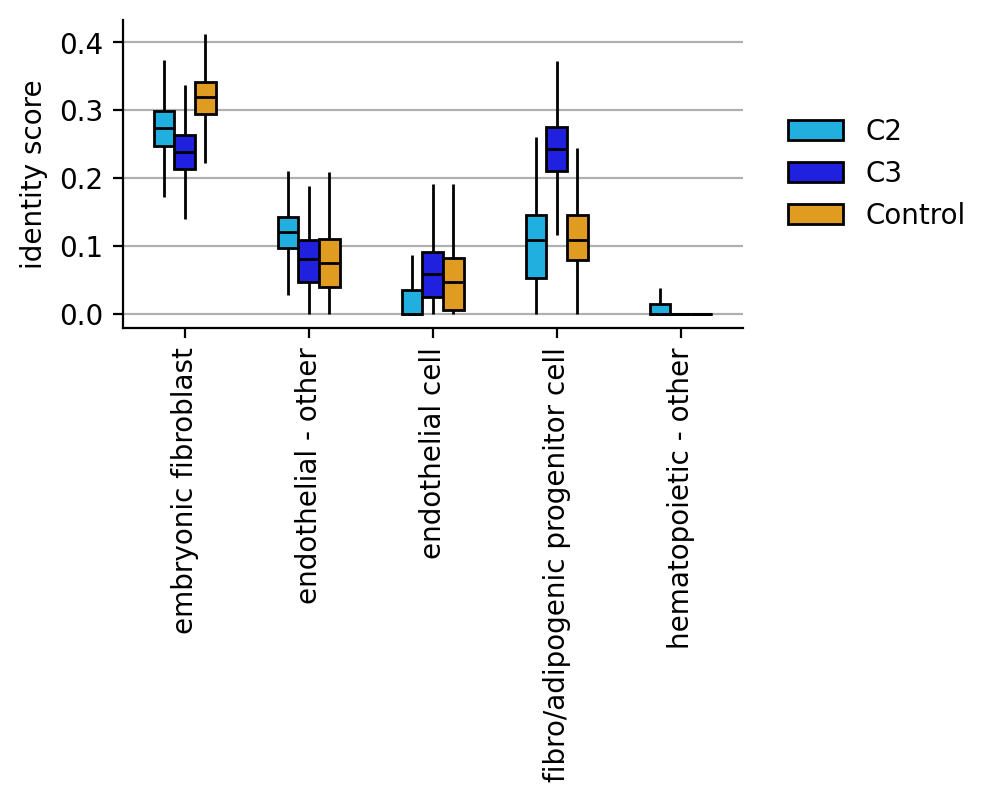

In [10]:
df = adata.obs.copy()
print(df.columns)

keep = [
    'cell_type',
    'frxn_embryonic fibroblast', 
    'frxn_endothelial - other',
    'frxn_endothelial cell', 
    'frxn_fibro/adipogenic progenitor cell',
    'frxn_hematopoietic - other',
    # 'frxn_hematopoietic stem cell',
]

df = df[keep]
df = pd.melt(df, id_vars='cell_type')
df['variable'] = df['variable'].str.replace("frxn_", "")

palette = {
    "C2": "deepskyblue",    # blue (related group 1)
    "C3": "b",    # light blue (related group 2)
    "Control": "orange"    # green (control)
}

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 2

sns.boxplot(
    data=df, 
    x='variable',
    y='value',
    hue='cell_type',
    hue_order=['C2', 'C3', 'Control'],
    linecolor='k',
    palette=palette,
    showfliers=False,
    capprops={'lw' : 0},
    width=0.5,
)

plt.grid(axis='y')
plt.xticks(rotation=90)
plt.xlabel("")
plt.ylabel("identity score")

sns.move_legend(
    plt.gca(), 
    title="",
    loc='center right',
    frameon=False,
    bbox_to_anchor=(1.4, 0.5),
)


sns.despine()

In [11]:
# break

Index(['batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes',
       'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters',
       'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score',
       'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices',
       'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order',
       'mean_pseudotime', 'mean_order', 'nnz', 'cell_type',
       'frxn_embryonic fibroblast', 'frxn_endothelial - other',
       'frxn_endothelial cell', 'frxn_fibro/adipogenic progenitor cell',
       'frxn_fibroblast - other', 'frxn

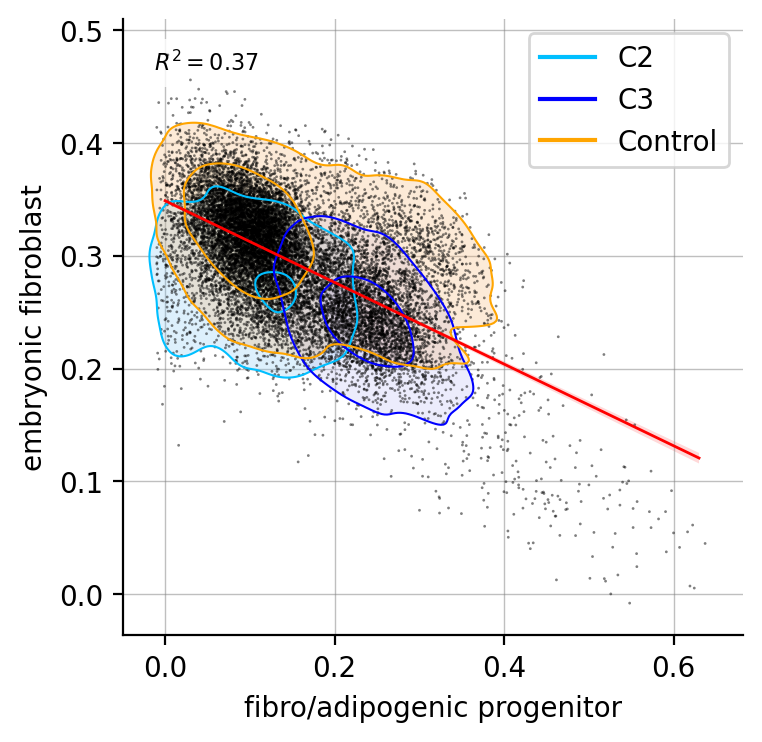

In [12]:
df = adata.obs.copy()
print(df.columns)

df = df[df['frxn_fibro/adipogenic progenitor cell'] > 0]
df = df.sort_values('cell_type')

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

palette = {
    "C2": "deepskyblue",    # blue (related group 1)
    "C3": "b",    # light blue (related group 2)
    "Control": "orange"    # green (control)
}

slope, intercept, r_value, p_value, std_err = linregress(
    df['frxn_fibro/adipogenic progenitor cell'],
    df['frxn_embryonic fibroblast']
)


sns.regplot(
    data=df,
    x='frxn_fibro/adipogenic progenitor cell',
    y='frxn_embryonic fibroblast',
    scatter_kws={'s': 1, 'color': 'k', 'alpha': 0.5, 'zorder': 4, 'ec' : 'none'},
    line_kws={'color': 'r', 'lw':1, 'zorder':10},
    n_boot=100,
    x_jitter=0.01, 
    y_jitter=0.01,
)

sns.kdeplot(
    data=df,
    x='frxn_fibro/adipogenic progenitor cell',
    y='frxn_embryonic fibroblast',
    hue='cell_type', 
    fill=True, 
    levels=3,
    bw_adjust=1.0,
    alpha=0.25,
    palette=palette,
    legend=False,
    zorder=3,
)

sns.kdeplot(
    data=df,
    x='frxn_fibro/adipogenic progenitor cell',
    y='frxn_embryonic fibroblast',
    hue='cell_type', 
    fill=False, 
    bw_adjust=1.0,
    levels=3,
    palette=palette,
    linewidths=0.75,  # Thinner lines
    # linestyles=":",
    # legend=False,
    zorder=5,
)

ax = plt.gca()
ax.set_xlabel('fibro/adipogenic progenitor')
ax.set_ylabel('embryonic fibroblast')
plt.grid(True, c='grey', lw=0.5, alpha=0.5)


ax.text(
    0.05, 0.95,
    f"$R^2 = {r_value**2:.2f}$",
    transform=ax.transAxes,
    verticalalignment='top',
    fontsize=8,
    bbox=dict(facecolor='white', edgecolor='none', alpha=0.8)
)
        
sns.move_legend(
    ax, 
    title="",
    loc='upper right',
    markerscale=2,
)

sns.despine()

Index(['batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes',
       'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters',
       'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score',
       'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices',
       'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order',
       'mean_pseudotime', 'mean_order', 'nnz', 'cell_type',
       'frxn_embryonic fibroblast', 'frxn_endothelial - other',
       'frxn_endothelial cell', 'frxn_fibro/adipogenic progenitor cell',
       'frxn_fibroblast - other', 'frxn

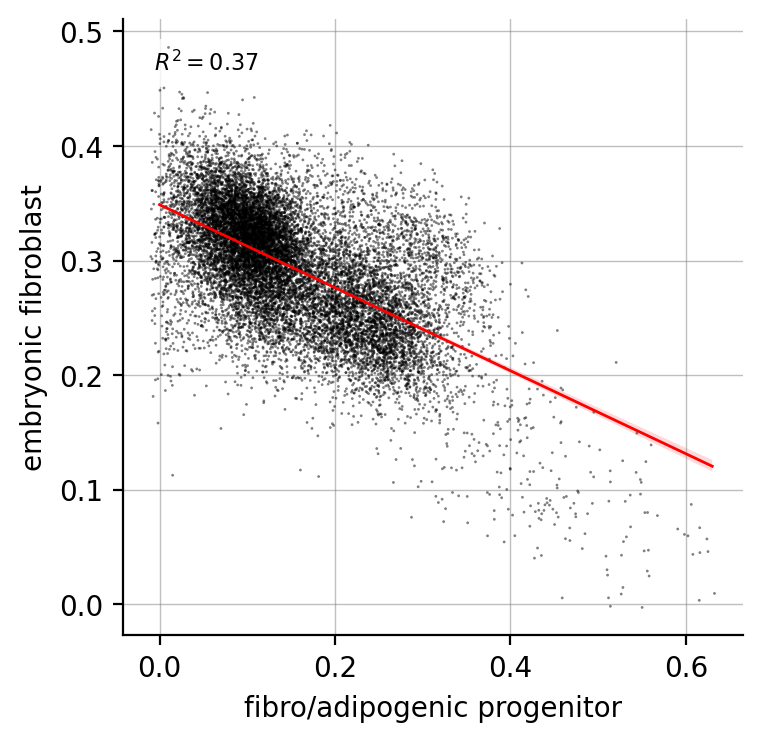

In [19]:
df = adata.obs.copy()
print(df.columns)

df = df[df['frxn_fibro/adipogenic progenitor cell'] > 0]
df = df.sort_values('cell_type')

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

palette = {
    "C2": "deepskyblue",    # blue (related group 1)
    "C3": "b",    # light blue (related group 2)
    "Control": "orange"    # green (control)
}

slope, intercept, r_value, p_value, std_err = linregress(
    df['frxn_fibro/adipogenic progenitor cell'],
    df['frxn_embryonic fibroblast']
)


sns.regplot(
    data=df,
    x='frxn_fibro/adipogenic progenitor cell',
    y='frxn_embryonic fibroblast',
    scatter_kws={'s': 1, 'color': 'k', 'alpha': 0.5, 'zorder': 4, 'ec' : 'none'},
    line_kws={'color': 'r', 'lw':1, 'zorder':10},
    n_boot=100,
    x_jitter=0.01, 
    y_jitter=0.01,
)


ax = plt.gca()
ax.set_xlabel('fibro/adipogenic progenitor')
ax.set_ylabel('embryonic fibroblast')
plt.grid(True, c='grey', lw=0.5, alpha=0.5)


ax.text(
    0.05, 0.95,
    f"$R^2 = {r_value**2:.2f}$",
    transform=ax.transAxes,
    verticalalignment='top',
    fontsize=8,
    bbox=dict(facecolor='white', edgecolor='none', alpha=0.8)
)

sns.despine()

frxn_embryonic fibroblast
frxn_endothelial - other
frxn_endothelial cell
frxn_fibro/adipogenic progenitor cell
frxn_fibroblast - other
frxn_hematopoietic - other
frxn_hematopoietic stem cell
frxn_skin fibroblast


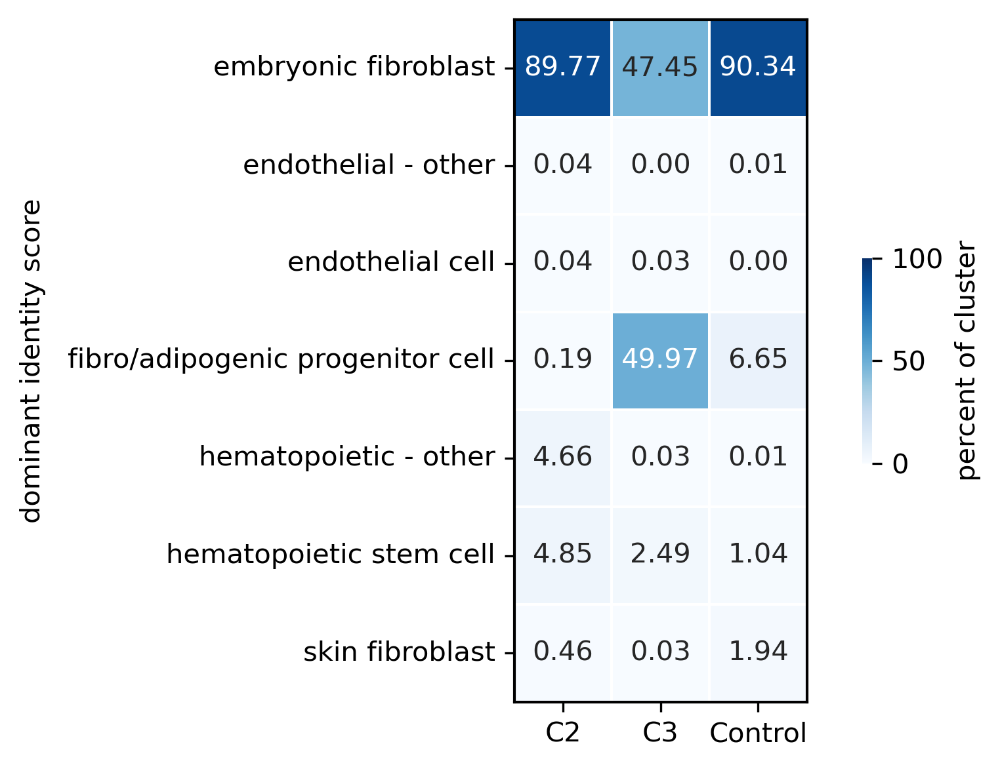

In [13]:
df = adata.obs.copy()
frxn_cols = [col for col in df.columns if col.startswith("frxn_")]

for x in frxn_cols:
    print(x)

df['prediction'] = df[frxn_cols].idxmax(axis=1)
df['prediction'] = df['prediction'].apply(lambda x: x.replace("frxn_", ""))

# Compute crosstab as before
X = pd.crosstab(df['cell_type'], df['prediction'])

# Convert to row percentages
X_percent = X.div(X.sum(axis=1), axis=0)
X_percent = X_percent * 100

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 6, 4

ax = sns.heatmap(
    X_percent.T,
    annot=True,
    cmap='Blues',
    fmt=".2f",
    linewidths=0.5,
    # linecolor='k',
    square=True,
    cbar_kws={"label": "percent of cluster", 'shrink' : 0.3},
    vmin=0, vmax=100,
)

ax.set_ylabel("dominant identity score", labelpad=8)
ax.set_xlabel("")
ax.tick_params(axis='y', rotation=0)

# Add all spines (borders)
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)
    spine.set_edgecolor("black")

plt.tight_layout()
plt.show()

[<Axes: title={'center': 'frxn_embryonic fibroblast'}, xlabel='FA1', ylabel='FA2'>,
 <Axes: title={'center': 'frxn_endothelial - other'}, xlabel='FA1', ylabel='FA2'>,
 <Axes: title={'center': 'frxn_endothelial cell'}, xlabel='FA1', ylabel='FA2'>,
 <Axes: title={'center': 'frxn_fibro/adipogenic progenitor cell'}, xlabel='FA1', ylabel='FA2'>,
 <Axes: title={'center': 'frxn_fibroblast - other'}, xlabel='FA1', ylabel='FA2'>,
 <Axes: title={'center': 'frxn_hematopoietic - other'}, xlabel='FA1', ylabel='FA2'>,
 <Axes: title={'center': 'frxn_hematopoietic stem cell'}, xlabel='FA1', ylabel='FA2'>,
 <Axes: title={'center': 'frxn_skin fibroblast'}, xlabel='FA1', ylabel='FA2'>]

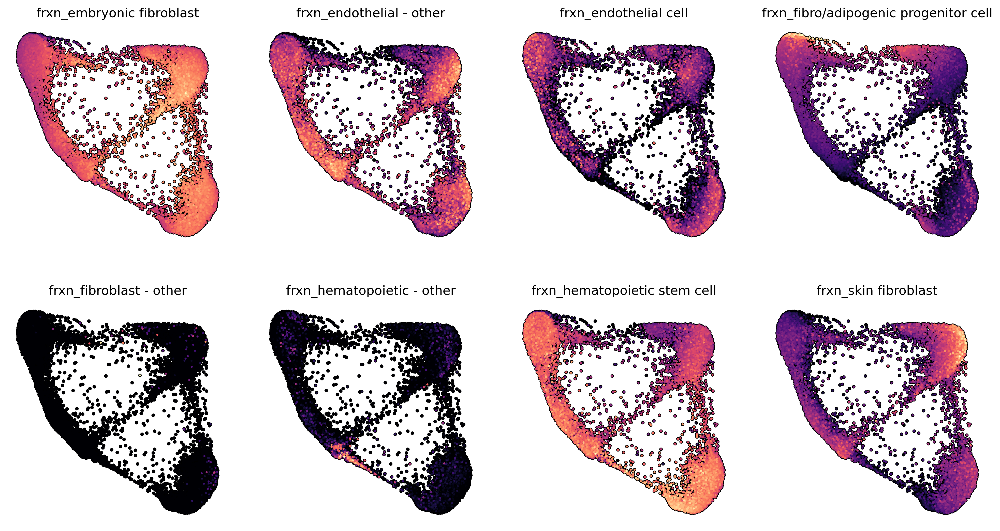

In [14]:
frxn_cols = [col for col in df.columns if col.startswith("frxn_")]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3.5, 4

sc.pl.draw_graph(
    adata, 
    color=frxn_cols,
    size=15,
    ncols=4,
    alpha=1,
    use_raw=False,
    add_outline=True,
    cmap='magma',
    colorbar_loc=None,
    outline_color=('k', 'k'),
    na_in_legend=False,
    frameon=False,
    # vmin=0,
    # vmax=1,
    wspace=0.15,
    show=False, 
)

# Find correlated genes

In [15]:
%%time 

alpha = 0.009

frxn_cols = [col for col in df.columns if col.startswith("frxn_")]
Y = adata.obs[frxn_cols].copy().astype(float)

X = adata[: ,adata.var['filter_pass']].to_df()

print(f"{X.shape=} {type(X)=}")
print(f"{Y.shape=} {type(Y)=}")

# Convert pandas DataFrames to CuPy arrays
X_gpu = cp.array(X.values)
Y_gpu = cp.array(Y.values)

gene_names = list(X.columns)  # Ensures this is a list of str

results = []

for i in tqdm(range(Y_gpu.shape[1])):
    lasso = Lasso(alpha=alpha, fit_intercept=False, max_iter=1000)
    lasso.fit(X_gpu, Y_gpu[:, i])
    
    coef = lasso.coef_  # NumPy array, shape (n_genes,)
    nonzero_idx = np.where(coef != 0)[0]

    print(f"{Y.columns[i]} {len(nonzero_idx)} genes")
    
    for j in nonzero_idx.tolist():  # j is scalar int
        gene = gene_names[j]
        coef_j = coef[j].item()  # make sure it's float, not array
        results.append({
            "target": Y.columns[i],
            "gene_name": gene,
            "coeff": coef_j,
        })

results_df = pd.DataFrame(results)
results_df = results_df.sort_values(['target', 'coeff'], ascending=[True, False])
results_df.head()

X.shape=(15867, 13052) type(X)=<class 'pandas.core.frame.DataFrame'>
Y.shape=(15867, 8) type(Y)=<class 'pandas.core.frame.DataFrame'>


 12%|█▎        | 1/8 [01:51<13:02, 111.79s/it]

frxn_embryonic fibroblast 14 genes


 25%|██▌       | 2/8 [03:15<09:30, 95.13s/it] 

frxn_endothelial - other 5 genes


 38%|███▊      | 3/8 [03:57<05:55, 71.10s/it]

frxn_endothelial cell 10 genes


 50%|█████     | 4/8 [05:14<04:53, 73.49s/it]

frxn_fibro/adipogenic progenitor cell 28 genes


 62%|██████▎   | 5/8 [05:15<02:21, 47.13s/it]

frxn_fibroblast - other 0 genes


 75%|███████▌  | 6/8 [05:16<01:02, 31.41s/it]

frxn_hematopoietic - other 5 genes


 88%|████████▊ | 7/8 [06:50<00:52, 52.12s/it]

frxn_hematopoietic stem cell 12 genes


100%|██████████| 8/8 [07:40<00:00, 57.54s/it]

frxn_skin fibroblast 12 genes
CPU times: user 7min 40s, sys: 4.78 s, total: 7min 45s
Wall time: 7min 45s


,target,gene_name,coeff
6,frxn_embryonic fibroblast,LGALS1,0.033573
2,frxn_embryonic fibroblast,COL1A2,0.008491
13,frxn_embryonic fibroblast,TPM2,0.008289
9,frxn_embryonic fibroblast,TAGLN,0.006747
7,frxn_embryonic fibroblast,MYL6,0.005687


frxn_embryonic fibroblast
group.shape=(14, 3)
====================  frxn_embryonic fibroblast  ====================
gene_name    coeff
   LGALS1 0.033573
   COL1A2 0.008491
     TPM2 0.008289
    TAGLN 0.006747
     MYL6 0.005687
   TMSB10 0.005680
      FN1 0.004137
    CALD1 0.003105
    THBS1 0.003074
   S100A6 0.001781


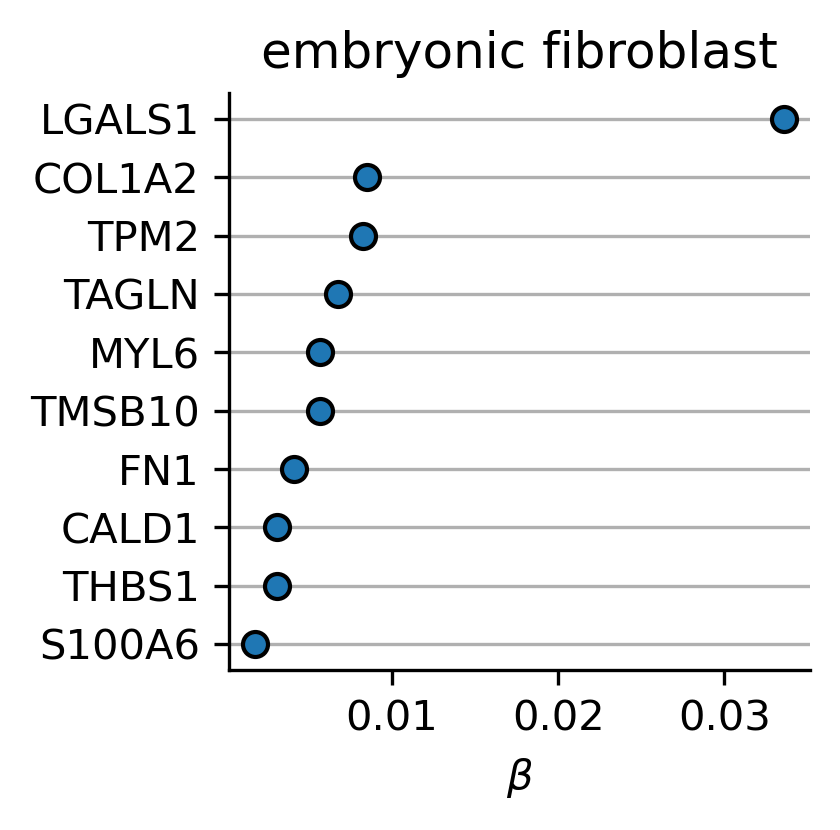

frxn_endothelial - other
group.shape=(5, 3)
====================  frxn_endothelial - other  ====================
gene_name    coeff
   S100A6 0.009723
     CCL2 0.005597
  S100A11 0.005317
  S100A10 0.002975
   TMSB10 0.000022


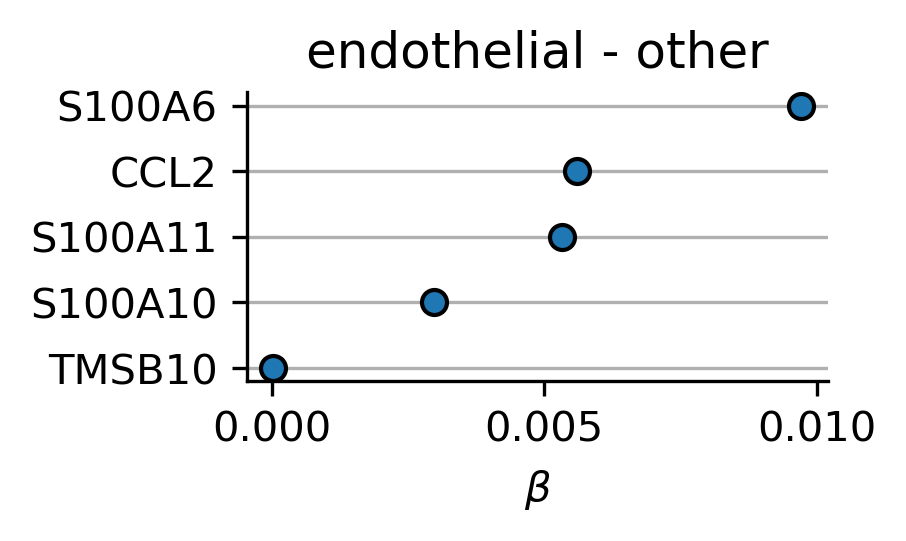

frxn_endothelial cell
group.shape=(10, 3)
====================  frxn_endothelial cell  ====================
gene_name    coeff
      DST 0.007832
    AHNAK 0.004588
     TPM4 0.002736
      VIM 0.002720
    TIMP3 0.001368
    YWHAZ 0.001312
     TUBB 0.001311
     ACTB 0.001244
 SERPINE1 0.000615
   CAVIN1 0.000574


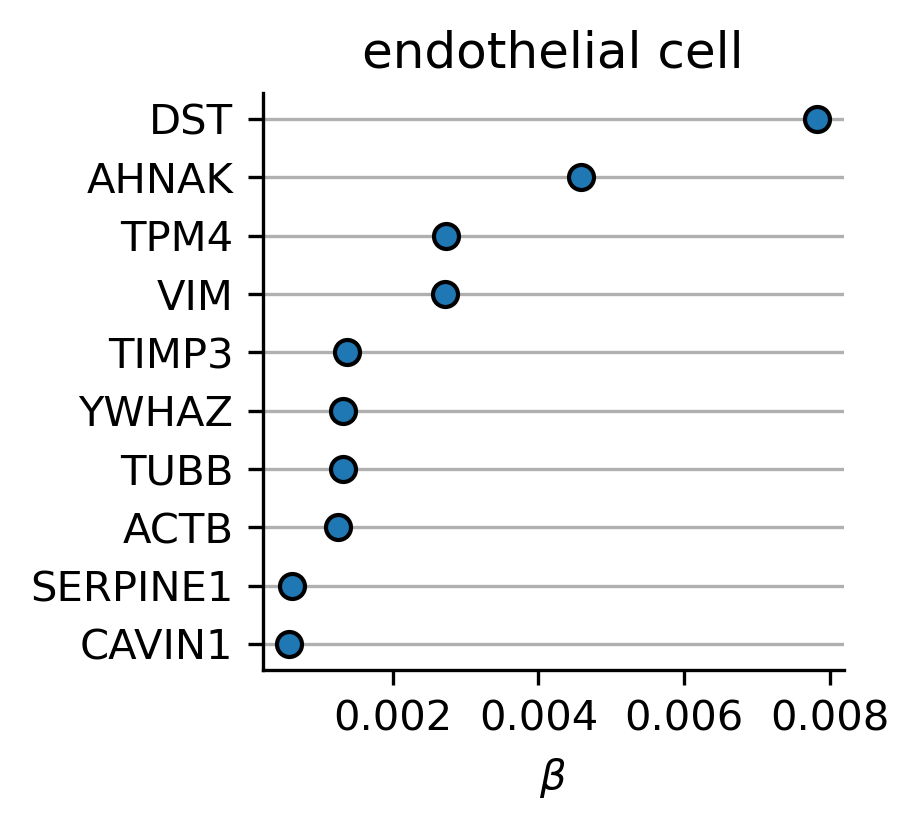

frxn_fibro/adipogenic progenitor cell
group.shape=(28, 3)
====================  frxn_fibro/adipogenic progenitor cell  ====================
gene_name    coeff
      DST 0.017378
    MAGI1 0.014961
    MAGI2 0.014568
   ZBTB20 0.012700
     EXT1 0.010186
     TRIO 0.009125
    ATXN1 0.008398
  CACNA1C 0.005718
    TTC28 0.005198
   FNDC3B 0.005131


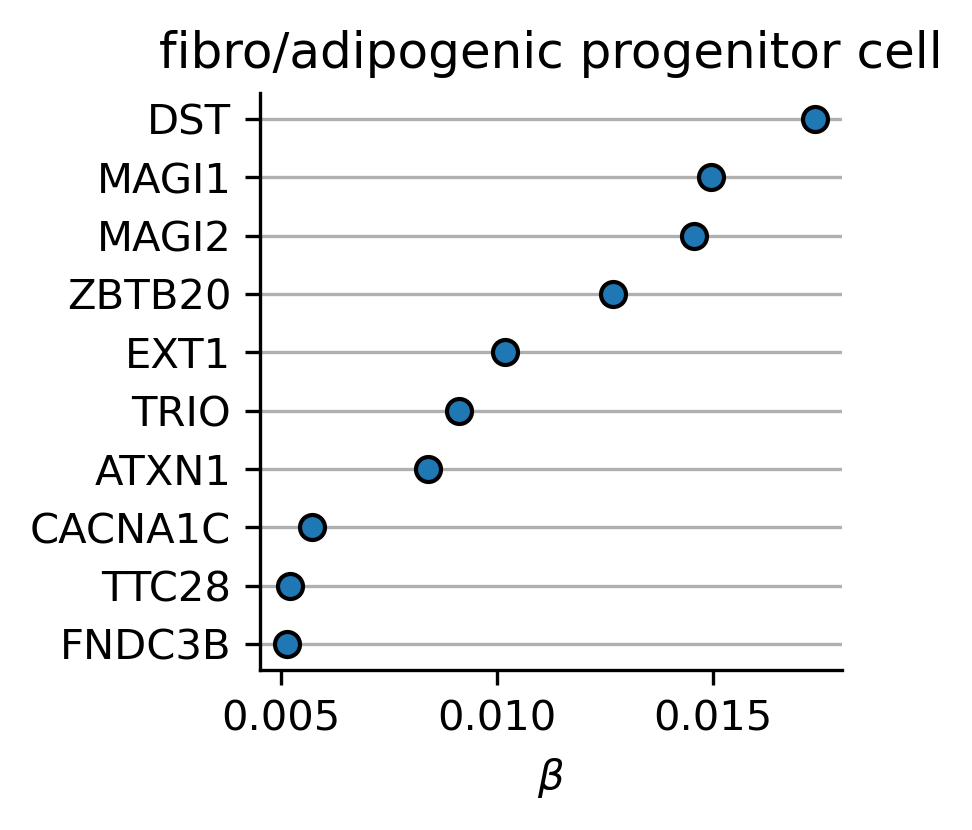

frxn_hematopoietic - other
group.shape=(5, 3)
====================  frxn_hematopoietic - other  ====================
gene_name    coeff
  ATP5F1E 0.000938
     ACTB 0.000544
   LGALS1 0.000327
      FTL 0.000190
   TMSB10 0.000050


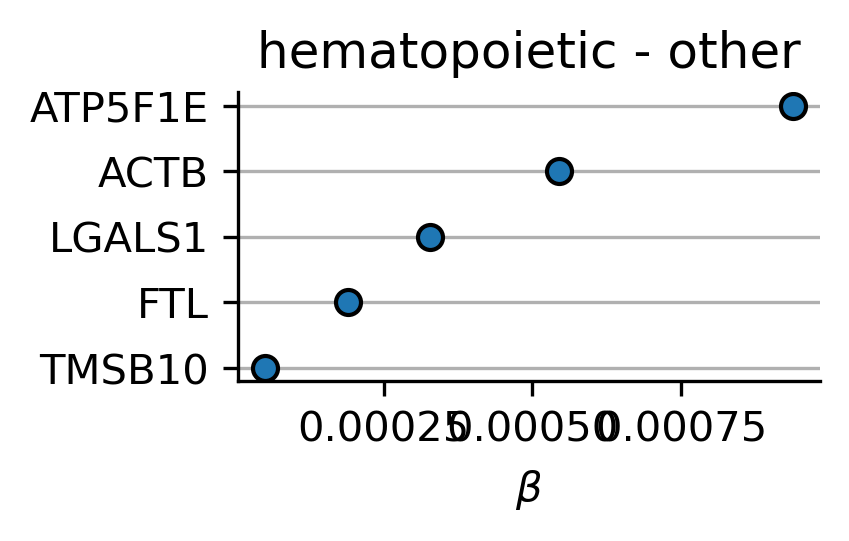

frxn_hematopoietic stem cell
group.shape=(12, 3)
====================  frxn_hematopoietic stem cell  ====================
gene_name    coeff
   S100A6 0.016801
    H2AZ1 0.011969
     PTMA 0.010551
  S100A10 0.005940
    PTTG1 0.003136
      NCL 0.002803
    HMGB1 0.002120
    HSPD1 0.001767
     PPIA 0.001724
    KRT18 0.001495


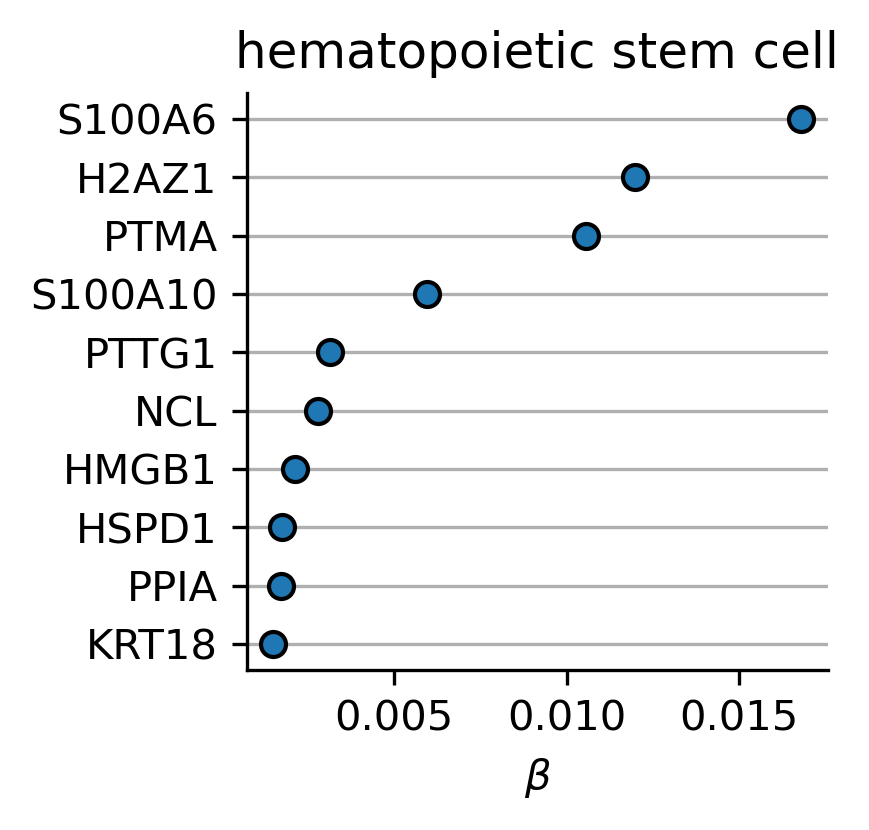

frxn_skin fibroblast
group.shape=(12, 3)
====================  frxn_skin fibroblast  ====================
gene_name     coeff
      DCN  0.014214
      FTL  0.010946
    TIMP1  0.007637
   IFITM1  0.004856
   SQSTM1  0.003716
     IFI6  0.003547
   LGALS3  0.002793
     CCL2  0.000031
    PCLAF -0.000787
    MAGI1 -0.001702


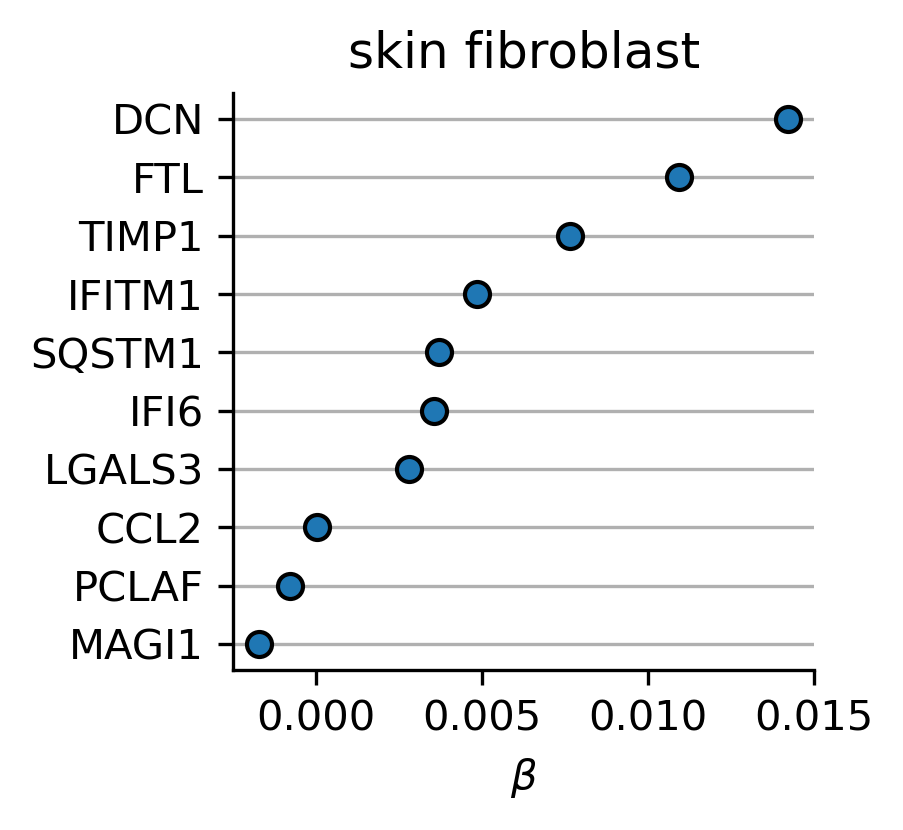

In [16]:
pdf = results_df.copy()

top = 10

for group_name, group in pdf.groupby('target'):
    print(group_name)
    print(f"{group.shape=}")

    group = group.sort_values('coeff', ascending=False)
    group = group.head(top)
    print("=" * 20, f" {group_name} ", "=" * 20)
    print(group[['gene_name', 'coeff']].to_string(index=False,))

    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 2.5, min(top, len(group)) /4
    
    sns.scatterplot(
        data=group,
        x='coeff',
        y='gene_name',
        ec='k',
        lw=1,
        zorder=2,
    )
    plt.grid(axis='y')
    plt.xlabel(r"$\beta$")
    plt.ylabel("")
    plt.title(group_name.replace("frxn_", ""))
    sns.despine()
    plt.show()

frxn_embryonic fibroblast
group.shape=(14, 3)


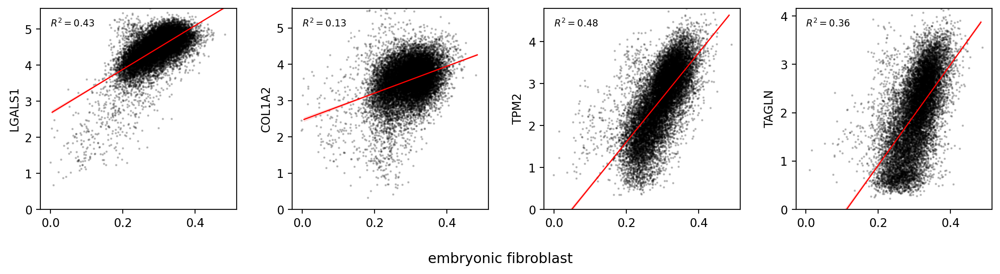

frxn_endothelial - other
group.shape=(5, 3)


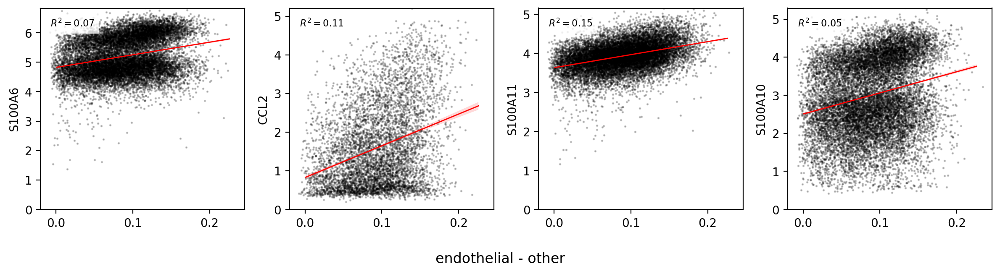

frxn_endothelial cell
group.shape=(10, 3)


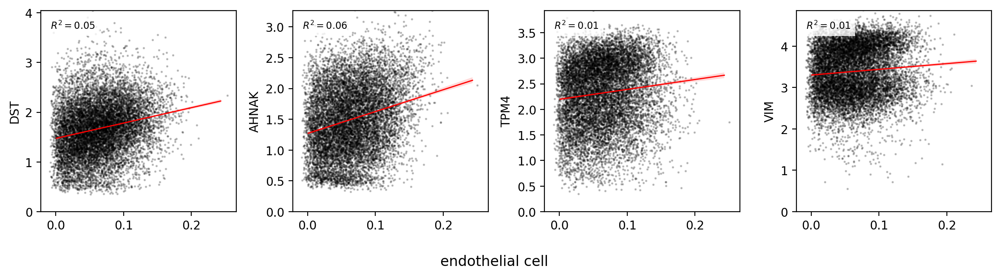

frxn_fibro/adipogenic progenitor cell
group.shape=(28, 3)


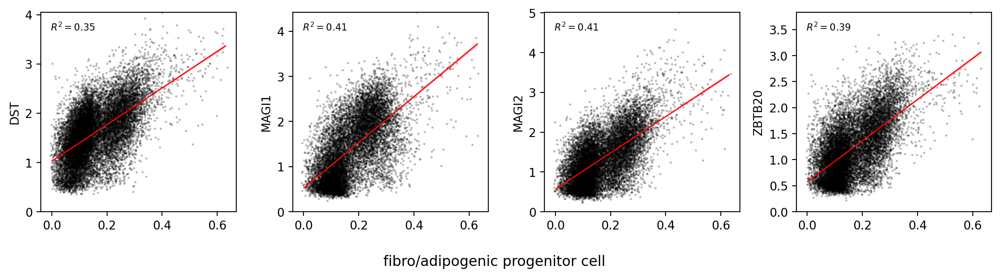

frxn_hematopoietic - other
group.shape=(5, 3)


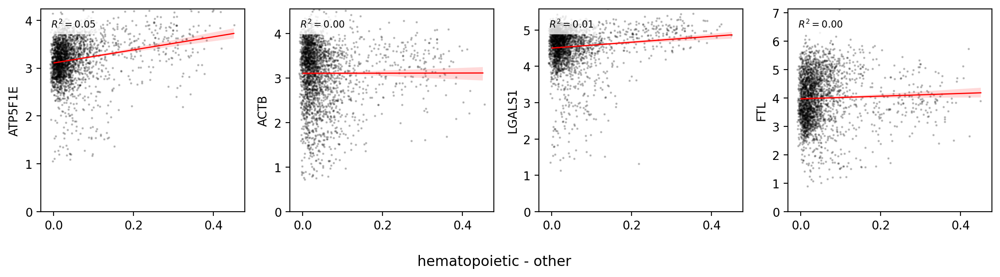

frxn_hematopoietic stem cell
group.shape=(12, 3)


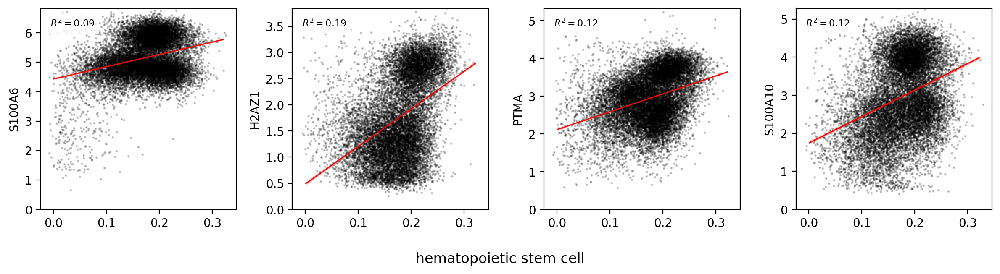

frxn_skin fibroblast
group.shape=(12, 3)


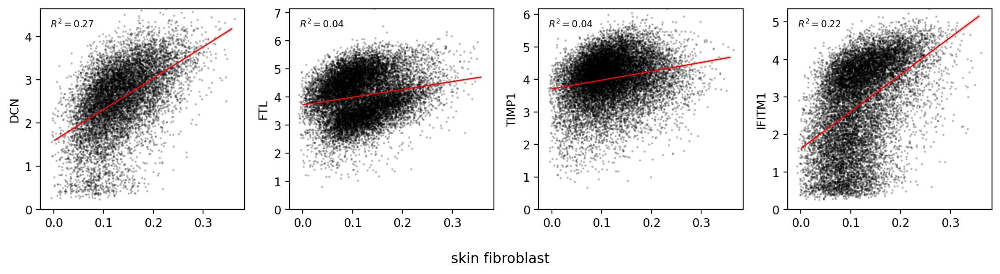

In [21]:
pdf = results_df.copy()

expression = adata.to_df()
obs = adata.obs.copy()

top = 4

for group_name, group in pdf.groupby('target'):
    print(group_name)
    print(f"{group.shape=}")

    group = group.sort_values('coeff', ascending=False)
    group = group.head(top)

    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = 12, 3.25
    fig, axes = plt.subplots(1, top, sharex=True)

    for i, gene in enumerate(group['gene_name'].values):

        x = obs[group_name]
        y = expression[gene]
        hue = obs['cell_type']

        mask = (x > 1e-3) & (y > 0)

        # Compute regression
        slope, intercept, r_value, p_value, std_err = linregress(
            x[mask], y[mask])

        # Plot with regression line and CI
        sns.regplot(
            x=x[mask], y=y[mask],
            scatter_kws={'s': 1, 'color': 'k', 'alpha': 0.2},
            line_kws={'color': 'r', 'lw':1},
            ax=axes[i],
            n_boot=100,
            x_jitter=0.01, 
            y_jitter=0.01,
        )

        # sns.kdeplot(
        #     x=x[mask], y=y[mask],
        #     hue=hue[mask], 
        #     fill=True, 
        #     levels=5,
        #     ax=axes[i],
        #     alpha=0.5,
        #     palette=palette,
        #     legend=False,
        # )

        # sns.kdeplot(
        #     x=x[mask], y=y[mask],
        #     hue=hue[mask], 
        #     fill=False, 
        #     levels=5,
        #     ax=axes[i],
        #     palette=palette,
        #     linewidth=0.5,
        #     linestyle="--",
        #     legend=False,
        # )

        axes[i].set_ylabel(gene)
        axes[i].set_xlabel("")
        axes[i].set_ylim([0, y[mask].max()])

        axes[i].text(
            0.05, 0.95,
            f"$R^2 = {r_value**2:.2f}$",
            transform=axes[i].transAxes,
            verticalalignment='top',
            fontsize=8,
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.8)
        )
        
    fig.supxlabel(group_name.replace("frxn_", ""))
    plt.tight_layout()    
    plt.show()
    # break

In [18]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

In [ ]:
gene = 'TRIO'
target = 'frxn_fibro/adipogenic progenitor cell'

pdf = pd.DataFrame({
    target : adata.obs[target].values,
    gene : adata.to_df()[gene].values,
    'cluster' : adata.obs['cell_type'].values,
})

pdf = pdf[pdf[gene] > 0]
pdf = pdf[pdf[target] > 0]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sns.scatterplot(
    data=pdf,
    x=target,
    y=gene,
    # hue='cluster',
    s=2,
    c='k',
    ec='none',
    alpha=0.75,
    
)
ax = plt.gca()
ax.set_xlabel(target.replace("frxn_", ""))
ax.set_ylabel(gene)
plt.grid(True, c='grey', lw=0.5, alpha=0.5)

# sns.move_legend(
#     ax, 
#     title="",
#     loc='upper right',
#     markerscale=2,
# )

sns.despine()

pdf.head()

In [ ]:
# Compute regression
slope, intercept, r_value, p_value, std_err = linregress(pdf[gene], pdf[target])

# Plot with regression line and CI
sns.regplot(
    data=pdf,
    x=target,
    y=gene,
    scatter_kws={'s': 2, 'color': 'k', 'alpha': 0.2},
    line_kws={'color': 'r', 'lw':1},
    # lowess=True,
    # x_bins=50,
    n_boot=100,
)

# Annotate regression stats
ax = plt.gca()
ax.text(
    0.05, 0.95,
    f"$R^2 = {r_value**2:.2f}$",
    transform=ax.transAxes,
    verticalalignment='top',
    fontsize=8,
    bbox=dict(facecolor='white', edgecolor='none', alpha=0.8)
)

In [ ]:
break

# Archive

In [ ]:
%%time 

frxn_cols = [col for col in df.columns if col.startswith("frxn_")]
obs_df = adata.obs[frxn_cols].copy().astype(float)



# # Prepare matrices
# X = adata.X
# if not isinstance(X, np.ndarray):
#     X = X.toarray()
# X_gpu = cp.array(X)  # shape: cells x genes

# frxn_cols = [col for col in df.columns if col.startswith("frxn_")]
# obs_df = adata.obs[frxn_cols].copy().astype(float)
# obs_gpu = cp.array(obs_df.values)  # shape: cells x frxn_cols

# gene_names = list(adata.var_names)

# results = []

# for i, frxn_col in enumerate(frxn_cols):
#     # Calculate R2 between this frxn_col and every gene
#     y_true = obs_gpu[:, i]
#     y_preds = X_gpu  # cells x genes

#     # Compute R2 for each gene (compared to this frxn_col)
#     # r2_score returns one value per gene
#     scores = r2_score(y_true, y_preds)
    
#     for j, gene in enumerate(gene_names):
#         results.append({
#             'Fraction Type': frxn_col,
#             'Gene': gene,
#             'R2': float(scores[j])
#         })

# # Convert to pandas DataFrame
# cor_df = pd.DataFrame(results)
# print("done!")

In [ ]:
break

In [ ]:
%%time

# Prepare cell-level fraction DataFrame
frxn_cols = [col for col in df.columns if col.startswith("frxn_")]
obs_df = adata.obs[frxn_cols].copy().astype(float)
X = adata.X
if not isinstance(X, np.ndarray):
    X = X.toarray()
gene_names = adata.var_names

# Compute Spearman correlation matrix: shape (n_fractions, n_genes)
# spearmanr returns correlation matrix for all pairs
print("Computing Spearman correlations...")
corrs = []
pvals = []

for frxn_col in tqdm(frxn_cols):
    rho, pval = spearmanr(X, obs_df[frxn_col], axis=0)
    corrs.append(rho[-1, :-1])    # last row = correlations with frxn_col, exclude self
    pvals.append(pval[-1, :-1])

cor_df = pd.DataFrame(
    np.stack(corrs),
    index=frxn_cols,
    columns=gene_names
).reset_index().melt(id_vars='index', var_name='Gene', value_name='SpearmanR')
cor_df.rename(columns={'index':'Fraction Type'}, inplace=True)

# Optionally add p-values
pval_df = pd.DataFrame(
    np.stack(pvals),
    index=frxn_cols,
    columns=gene_names
).reset_index().melt(id_vars='index', var_name='Gene', value_name='P-value')
pval_df.rename(columns={'index':'Fraction Type'}, inplace=True)

# Merge results
cor_df['P-value'] = pval_df['P-value']

print('done!')

In [ ]:
break

In [ ]:
# Copy and melt
df = adata.obs.copy()
frxn_cols = [col for col in df.columns if col.startswith("frxn_")]
df_melted = df.melt(
    id_vars=["cell_type"],
    value_vars=frxn_cols,
    var_name="Cell Type",
    value_name="Fraction"
)

# Plot with FacetGrid
g = sns.FacetGrid(
    df_melted,
    col="Cell Type",
    hue="Cell Type",
    col_wrap=5,
    sharey=True,
    height=2,
    aspect=0.85,
)

g.map_dataframe(
    sns.boxplot,
    x="cell_type",
    y="Fraction",
    order=['C2', 'C3', 'Control'],
    width=0.65,
    linecolor='k',
    capprops={'linewidth': 0},  
    showfliers=False,
    linewidth=0.8
)

g.set_axis_labels("", "identity score")
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=0, labelsize=8)
    ax.grid(axis='y', linestyle='--', alpha=0.3)
     
    title = ax.get_title()
    title = title.split("frxn_")[1]
    if len(title) > 20:
        title = "\n".join(title.split(maxsplit=1))
    ax.set_title(title, fontsize=9)

g.fig.subplots_adjust(wspace=0.2)

plt.tight_layout()
plt.show()


In [ ]:
for 

In [ ]:
break

In [ ]:
# # Select frxn columns
# df = adata.obs.copy()
# frxn_cols = [col for col in df.columns if col.startswith("frxn_")]
# print(frxn_cols)

# # Melt the data
# df_melted = df.melt(
#     id_vars=["cluster_str"],
#     value_vars=frxn_cols,
#     var_name="Cell Type",
#     value_name="Fraction"
# )

# # filter 
# keep = [
#     'frxn_embryonic fibroblast', 
#     'frxn_endothelial cell',
#     'frxn_fibro/adipogenic progenitor cell', 
#    ]
# df_melted = df_melted[df_melted["Cell Type"].isin(keep)]

# # Improve cell type labels (optional)
# df_melted["Cell Type"] = df_melted["Cell Type"].str.replace("frxn_", "").str.replace("_", " ")
# df_melted = df_melted.sort_values("Cell Type")


# # Plot
# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 4, 3

# sns.boxplot(
#     data=df_melted,
#     x="cluster_str",
#     y="Fraction",
#     hue="Cell Type",
#     showfliers=False,
#     capprops={'lw':0,},
#     linecolor='k',
#     linewidth=0.8,
#     palette='nipy_spectral',
# )

# sns.stripplot(
#     data=df_melted[df_melted["Fraction"] > 0],
#     x="cluster_str",
#     y="Fraction",
#     hue="Cell Type",
#     dodge=True,
#     jitter=0.25,
#     alpha=0.5,
#     s=0.5,
#     edgecolor='none',
#     palette='dark:k',
#     legend=False,
# )

# plt.xlabel("")
# plt.ylabel("identity score")
# plt.xticks(rotation=0, fontsize=10)
# plt.yticks(fontsize=10)

# plt.grid(axis='y', linestyle='--', alpha=0.3)
# plt.margins(y=0.1)
# plt.legend(
#     title="", 
#     bbox_to_anchor=(1.75, 0.5), 
#     loc='center right',
#     fontsize=8,
#     markerscale=2.5
    
# )
# sns.despine()
# plt.show()


In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

frxn_cols = [col for col in adata.obs.columns if col.startswith("frxn_")]
print(frxn_cols)

sc.pl.draw_graph(
    adata, 
    color=frxn_cols,
    size=15,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    na_in_legend=False,
    cmap='gnuplot',
    frameon=False,
    wspace=0.15,
    show=False, 
)

In [ ]:
pdf = adata.obs.copy()

# Extract variables
x = pdf['mean_pseudotime']
y = pdf['frxn_endothelial cell']

# Compute Pearson correlation
r, p = pearsonr(x, y)
print(f"{r=} {p=}")

# Set figure parameters
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = (3, 3)

# Create plot
ax = sns.regplot(
    data=pdf,
    x='mean_pseudotime',
    y='frxn_endothelial cell',
    x_bins=100,
    scatter_kws={'s': 5, 'alpha': 0.7, 'color': 'gray'},
    line_kws={'color': 'blue', 'linewidth': 1.5}
)

# Annotate plot
plt.title('endothelial score', fontsize=12)
plt.xlabel("pseudotime", fontsize=11)
plt.ylabel("proportion", fontsize=11)
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Add r and p-value annotation
annot_text = f"$r$ = {r:.2f}"
ax.text(0.05, 0.95, annot_text, transform=ax.transAxes,
        fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round,pad=0.3'))

sns.despine()
plt.tight_layout()
plt.show()


# Error 

In [ ]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 3, 3

sns.boxplot(
    data=adata.obs,
    x='cluster_str',
    y='Error',
    hue='cluster_str',
    showfliers=False,
    capprops={'lw':0,},
    linecolor='k',
    linewidth=0.8,
)

plt.xlabel("")
sns.despine()

print(adata.obs.groupby('cluster_str').agg(
    mean_error = ('Error', 'mean'),
    std_error = ('Error', 'std'),
    
).to_string())

In [ ]:
# Select frxn columns
df = adata.obs.copy()
frxn_cols = [col for col in df.columns if col.startswith("frxn_")]
print(frxn_cols)

# Melt the data
df_melted = df.melt(
    id_vars=["cluster_str"],
    value_vars=frxn_cols,
    var_name="Cell Type",
    value_name="Fraction"
)

# Improve cell type labels (optional)
df_melted["Cell Type"] = df_melted["Cell Type"].str.replace("frxn_", "").str.replace("_", " ").str.title()
df_melted = df_melted.sort_values("Cell Type")


# Plot
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 3
sns.boxplot(
    data=df_melted,
    x="cluster_str",
    y="Fraction",
    hue="Cell Type",
    showfliers=False,
    capprops={'lw':0,},
    linecolor='k',
    linewidth=0.8,
    palette='tab20',
)

plt.xlabel("", fontsize=12)
plt.ylabel("proportion", fontsize=12)
plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)
plt.legend(title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9, title_fontsize=10, ncols=3)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
sns.despine()
plt.show()


In [ ]:
# break

In [ ]:
# Copy and melt
df = adata.obs.copy()
frxn_cols = [col for col in df.columns if col.startswith("frxn_")]
df_melted = df.melt(
    id_vars=["cluster_str"],
    value_vars=frxn_cols,
    var_name="Cell Type",
    value_name="Fraction"
)


# Plot with FacetGrid
g = sns.FacetGrid(
    df_melted,
    col="Cell Type",
    col_wrap=3,
    sharey=True,
    height=2,
    aspect=0.9,
)

g.map_dataframe(
    sns.boxplot,
    x="cluster_str",
    y="Fraction",
    hue='Cell Type',
    order=sorted(df["cluster_str"].unique()),
    width=0.45,
    linecolor='k',
    capprops={'linewidth': 0},  
    # flierprops={'markersize': 0.5, 'alpha': 0.5},
    showfliers=False,
    linewidth=0.8
)

g.set_axis_labels("", "identity score")
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=0, labelsize=8)
    ax.grid(axis='y', linestyle='--', alpha=0.3)
     
    title = ax.get_title()
    title = title.split("frxn_")[1]
    ax.set_title(title, fontsize=6)

g.fig.subplots_adjust(wspace=0.2)

plt.tight_layout()
sns.despine(trim=True)
plt.show()


In [ ]:
break

# Discrete assignment

In [ ]:
# Assign based on max fraction
frac_cols = ['frxn_endothelial_cells', 'frxn_fibroblasts', 
             'frxn_hematopoietic_progenitors', 'frxn_hsc']
adata.obs['capybara_assignment'] = adata.obs[frac_cols].idxmax(axis=1)

print(adata.obs['capybara_assignment'].value_counts().to_string())
print()

# Group and count
plot_df = (
    adata.obs
    .groupby(['cluster_str', 'capybara_assignment'])
    .size()
    .reset_index(name='count')
)

# Clean labels
plot_df['capybara_assignment'] = (
    plot_df['capybara_assignment']
    .str.replace("frxn_", "", regex=False)
    .str.replace("_", " ")
)

# Normalize to proportions within each cluster
plot_df['proportion'] = (
    plot_df
    .groupby('cluster_str')['count']
    .transform(lambda x: x / x.sum())
)
plot_df.head()

In [ ]:
color_dict = {
    'endothelial cells':  "#1F78B4",
    'fibroblasts':        "#1B9E77",  
    'hematopoietic progenitors':  "#6A3D9A",  
}

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 2

sns.barplot(
    data=plot_df,
    x='cluster_str',
    y='proportion',
    hue='capybara_assignment',
    palette=color_dict,
    ec='k',
)

sns.move_legend(
    plt.gca(), 
    title="",
    loc='lower center',
    ncols=3,
    frameon=False,
    bbox_to_anchor=(0.5, -0.35),
    fontsize=7,
)

plt.ylabel('proportion of cluster')

sns.despine()
plt.xlabel("")

In [ ]:
assignments = sorted(plot_df['capybara_assignment'].unique())

color_dict = {
    'endothelial cells':  "#1F78B4",
    'fibroblasts':        "#1B9E77",  
    'hematopoietic progenitors':  "#6A3D9A",  
}

# Prepare base figure
clusters = sorted(plot_df['cluster_str'].unique())
n = len(clusters)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 1.5 * n, 2  # Wider per pie
fig, ax = plt.subplots()

# Draw each pie at x=i
for i, cluster in enumerate(clusters):
    sub_df = plot_df[plot_df['cluster_str'] == cluster]
    sizes = sub_df['proportion']
    colors = [color_dict[cell_type] for cell_type in sub_df['capybara_assignment']]
    labels = [f"{p*100:.0f}%" if p > 0.005 else "" for p in sizes]
    
    # Wider + closer pie charts: adjust x0, width, height
    x0 = i / n  # evenly spaced, no extra padding
    inset_ax = ax.inset_axes([x0, 0.05, 0.2, 0.9])  # narrower width
    inset_ax.pie(
        sizes,
        colors=colors,
        labels=labels,
        labeldistance=1.25,  # moves labels outside
        startangle=90,
        textprops={'fontsize': 7},
        wedgeprops={'linewidth': 1, 'edgecolor': 'k'}
    )
    inset_ax.set_aspect("equal")
    inset_ax.axis('off')

# Axis formatting
ax.set_xlim(-0.5, len(clusters))
ax.set_xticks(np.array(range(len(clusters))) + 0.2 )
ax.set_xticklabels(clusters, rotation=0, fontsize=8)
ax.set_yticks([])
ax.set_xlabel("", fontsize=10)
ax.tick_params(axis='x', length=0)

# Shared legend
legend_handles = [
    Patch(facecolor=color_dict[label], edgecolor='k', label=label)
    for label in assignments
]
ax.legend(
    handles=legend_handles,
    title="",
    bbox_to_anchor=(0.5, 1.25),
    ncols=3,
    loc='upper center',
    frameon=False,
    fontsize=8,
    title_fontsize=9,
)

plt.tight_layout()
sns.despine(bottom=True, left=True)
plt.show()

In [ ]:
# break

# Hybrid assignments

In [ ]:
# Assign based on max fraction
frac_cols = ['frxn_endothelial_cells', 'frxn_fibroblasts', 
             'frxn_hematopoietic_progenitors', 'frxn_hsc']

# Relaxed threshold for hybrid assignment
hybrid_thresh = 0.2

def assign_relaxed_hybrid(row):
    # Get fractions above threshold
    above_thresh = row[row > hybrid_thresh].index.tolist()
    
    # Clean and format label
    if len(above_thresh) == 0:
        return "unassigned"
    
    clean_labels = [s.replace("frxn_", "").replace("_", " ") for s in above_thresh]
    return "+".join(sorted(clean_labels))

# Apply to obs
adata.obs['capybara_assignment'] = adata.obs[frac_cols].apply(assign_relaxed_hybrid, axis=1)

print(adata.obs['capybara_assignment'].value_counts().to_string())
print()

# Group and count
plot_df = (
    adata.obs
    .groupby(['cluster_str', 'capybara_assignment'])
    .size()
    .reset_index(name='count')
)

# Clean labels
plot_df['capybara_assignment'] = (
    plot_df['capybara_assignment']
    .str.replace("frxn_", "", regex=False)
    .str.replace("_", " ")
)

# Normalize to proportions within each cluster
plot_df['proportion'] = (
    plot_df
    .groupby('cluster_str')['count']
    .transform(lambda x: x / x.sum())
)
plot_df.head()

In [ ]:
# Pivot to wide format: rows = assignment, columns = cluster, values = proportion
heat_df = plot_df.pivot(
    index='capybara_assignment',
    columns='cluster_str',
    values='proportion'
).fillna(0)


# Define abbreviations
abbrev_map = {
    'fibroblasts': 'Fib',
    'hematopoietic progenitors': 'HP',
    'endothelial cells': 'EC',
    'hsc': 'HSC',
    'unassigned': 'NA'
}

# Helper to rename full label to abbreviations and replace "+" with "/"
def abbreviate(label):
    parts = label.split('+')
    abbrev_parts = [abbrev_map.get(p.strip(), p.strip()) for p in parts]
    return '/'.join(abbrev_parts)

# Apply to index
heat_df.index = heat_df.index.map(abbreviate)


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5.75, 5

sns.heatmap(
    heat_df,
    cmap='Blues',
    linewidths=0.5,
    square=True,
    linecolor='k',
    cbar_kws={'label': 'proportion of cells', 'shrink': 0.5},
    annot=True,
    fmt=".2f"
)

plt.xlabel("")
plt.ylabel("hybrid assignments")
plt.tight_layout()
plt.show()


In [ ]:
# break

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

adata.obs['capy_abbrev'] = adata.obs['capybara_assignment'].map(abbreviate)
print(adata.obs['capy_abbrev'].value_counts().to_string())

sc.pl.draw_graph(
    adata, 
    color=['capy_abbrev'],
    size=15,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    na_in_legend=False,
    palette='Spectral',
    title="",
    frameon=False,
    wspace=0.15,
    show=False, 
)

In [ ]:
pdf = adata.obs.copy()

# Extract variables
x = pdf['mean_pseudotime']
y = pdf['frxn_endothelial_cells']

# Compute Pearson correlation
r, p = pearsonr(x, y)
print(f"{r=} {p=}")

# Set figure parameters
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = (3, 3)

# Create plot
ax = sns.regplot(
    data=pdf,
    x='mean_pseudotime',
    y='frxn_endothelial_cells',
    x_bins=100,
    scatter_kws={'s': 5, 'alpha': 0.7, 'color': 'gray'},
    line_kws={'color': 'blue', 'linewidth': 1.5}
)

# Annotate plot
plt.title('endothelial score', fontsize=12)
plt.xlabel("pseudotime", fontsize=11)
plt.ylabel("proportion", fontsize=11)
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Add r and p-value annotation
annot_text = f"$r$ = {r:.2f}"
ax.text(0.05, 0.95, annot_text, transform=ax.transAxes,
        fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round,pad=0.3'))

sns.despine()
plt.tight_layout()
plt.show()


In [ ]:
pdf = adata.obs.copy()


# Extract variables
x = pdf['mean_pseudotime']
y = pdf['frxn_fibroblasts']

# Compute Pearson correlation
r, p = pearsonr(x, y)
print(f"{r=} {p=}")

# Set figure parameters
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = (3, 3)

# Create plot
ax = sns.regplot(
    data=pdf,
    x='mean_pseudotime',
    y='frxn_fibroblasts',
    x_bins=100,
    scatter_kws={'s': 5, 'alpha': 0.7, 'color': 'gray'},
    line_kws={'color': 'r', 'linewidth': 1.5}
)

# Annotate plot
plt.title('fibroblast score', fontsize=12)
plt.xlabel("pseudotime", fontsize=11)
plt.ylabel("proportion", fontsize=11)
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Add r and p-value annotation in top right
annot_text = f"$r$ = {r:.2f}"
ax.text(0.95, 0.95, annot_text, transform=ax.transAxes,
        fontsize=10, verticalalignment='top', horizontalalignment='right',
        bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round,pad=0.3'))

sns.despine()
plt.tight_layout()
plt.show()


In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.draw_graph(
    adata, 
    color=['cluster_str', 'frxn_fibroblasts', 'frxn_endothelial_cells', 'frxn_hematopoietic_progenitors', 'frxn_hsc'],
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    wspace=0.5,
)

In [ ]:
adata.obs.columns

In [ ]:
print(adata.obs[['cluster_str', 'frxn_fibroblasts', 'frxn_hematopoietic_progenitors', 'frxn_hsc', 'frxn_endothelial_cells']].head().to_string())

In [ ]:
# break

# Find the correlates

In [ ]:
# Select only the columns of interest
frxn_cols = ['frxn_fibroblasts', 'frxn_hematopoietic_progenitors', 'frxn_hsc', 'frxn_endothelial_cells']

# Extract gene expression matrix (assumes log-normalized)
X = adata.X
if not isinstance(X, np.ndarray):
    X = X.toarray()  # Convert sparse matrix to dense if needed

# Get gene names
gene_names = adata.var_names

# Extract cell-level fractions
obs_df = adata.obs[frxn_cols].copy()
assert obs_df.shape[0] == X.shape[0], "Mismatch in number of cells"

# Store results
results = []

print("Computing Spearman correlations...")
for frxn_col in tqdm(frxn_cols):
    for i, gene in enumerate(gene_names):
        rho, pval = spearmanr(X[:, i], obs_df[frxn_col])
        results.append({
            'Fraction Type': frxn_col,
            'Gene': gene,
            'SpearmanR': rho,
            'P-value': pval
        })

# Convert to DataFrame
cor_df = pd.DataFrame(results)

print('done!')


In [ ]:
# For each fraction type, get top genes by absolute Spearman R
alpha = 0.05
pdf = cor_df[cor_df['P-value'] < alpha].copy()
pdf = pdf.sort_values(['Fraction Type', 'SpearmanR'], ascending=[True, False])
pdf = pdf[~pdf['Gene'].str.startswith('RP')]


# For each fraction type, get top genes by absolute Spearman R
top_cor_df = pdf.groupby('Fraction Type', group_keys=False).head(15)
print(top_cor_df.to_string(index=False))

# Enrichment

In [ ]:
# For each fraction type, get top genes by absolute Spearman R
alpha = 0.05
pdf = cor_df[cor_df['P-value'] < alpha].copy()
pdf = pdf.sort_values(['Fraction Type', 'SpearmanR'], ascending=[True, False])
pdf = pdf[~pdf['Gene'].str.startswith('RP')]

# For each fraction type, get top genes by absolute Spearman R
top_cor_df = pdf.groupby('Fraction Type', group_keys=False).head(15)

top_cor_df.head()

In [ ]:
# Filter significant correlations
alpha = 0.05
pdf = cor_df[cor_df['P-value'] < alpha].copy()
pdf = pdf.sort_values(['Fraction Type', 'SpearmanR'], ascending=[True, False])
pdf = pdf[~pdf['Gene'].str.startswith('RP')]

# Get top 15 genes by Fraction Type
top_cor_df = pdf.groupby('Fraction Type', group_keys=False).head(15)

for frac_type, group in top_cor_df.groupby('Fraction Type'):
    genes = group['Gene'].head(100).tolist()
    edf = gget.enrichr(genes, database="ontology")
    edf['genes'] = edf['overlapping_genes'].apply(lambda x: ",".join(x))
    edf = edf[['path_name', 'adj_p_val', 'genes']]
    print("=" * 20, f"{frac_type}", "=" * 20)
    print(edf.head(10).to_string(index=False))

    edf['log_adj_p'] = -np.log10(edf['adj_p_val'].clip(lower=1e-300))
    edf['path_name_wrapped'] = edf['path_name'].apply(lambda x: '\n'.join(textwrap.wrap(x, width=60)))

    # Barplot
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 4, 4
    sns.barplot(
        data=edf.head(15),
        y='path_name_wrapped',
        x='log_adj_p',
        ec='k',
        color='lightgrey',
        linewidth=0.75,
        width=0.5,
    )
    plt.xlabel('-log10(Adjusted P-value)')
    plt.ylabel('')
    plt.yticks(fontsize=6)
    plt.title(frac_type)
    sns.despine(trim=True)
    plt.show()

# Plotting

In [ ]:
pdf = cor_df[cor_df['P-value'] < alpha].copy()
pdf[pdf['Fraction Type'] == 'frxn_endothelial_cells'].sort_values('SpearmanR', ascending=False).head(25)

In [ ]:

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

color = [
    'SERPINE1', 'HIP1', 'AHNAK2',
    'MAGI2', 'GAS7', 'YWHAZ',
]

sc.pl.draw_graph(
    adata, 
    color=color,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.15,
)


In [ ]:
# For each fraction type, get top genes by absolute Spearman R
alpha = 0.05
pdf = cor_df[cor_df['P-value'] < alpha].copy()
pdf = pdf.sort_values(['Fraction Type', 'SpearmanR'], ascending=[True, False])
pdf = pdf[~pdf['Gene'].str.startswith('RP')]


labels = {
    'frxn_endothelial_cells': 'Endothelial Cells',
    'frxn_fibroblasts': 'Fibroblasts',
    'frxn_hematopoietic_progenitors': 'Progenitors',
    'frxn_hsc': 'HSCs'
}

# For each fraction type, get top genes by absolute Spearman R
top_cor_df = pdf.groupby('Fraction Type', group_keys=False).head(15)
top_cor_df['label'] = top_cor_df['Fraction Type'].map(labels)

for group, group_df in top_cor_df.groupby(['label']):

    frxn_type = group_df['Fraction Type'].unique()[0]
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 4, 4

    sc.pl.draw_graph(
        adata, 
        color=[frxn_type] + group_df['Gene'].head(8).to_list(),
        size=25,
        ncols=3,
        alpha=1,
        use_raw=False,
        add_outline=True,
        outline_color=('k', 'k'),
        title=[group[0]] + group_df['Gene'].head(8).to_list(),
        frameon=False,
        wspace=0.15,
        show=False, 
    )

    plt.suptitle(f"{group[0]} correlates", fontsize=14)
    plt.show()    